# Import

In [1]:
import os
import glob
import cv2
import numpy as np

import numpy as np
import matplotlib.pyplot as plt

# Picture Acquisition

In [2]:

def load_image_and_remove_padding(
        image_path,
        min_valid_intensity=2,
        return_mask=False):
    """
    Load grayscale EL image and remove padding/bezel pixels.

    Parameters
    ----------
    image_path : str
        Path ke file .tiff
    min_valid_intensity : int
        Threshold untuk buang padding (default 2)
    return_mask : bool
        Kalau True, return juga mask 2D untuk visualisasi

    Returns
    -------
    phi_values : 1D numpy array
        Pixel intensity valid (tanpa padding)
    mask (optional) : 2D boolean array
    """

    # Load image grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        raise ValueError(f"Gagal load image: {image_path}")

    img = img.astype(np.float64)

    # Mask padding
    mask = img >= min_valid_intensity

    intensity_map = img[mask]

    if intensity_map.size == 0:
        raise ValueError("Tidak ada pixel valid setelah padding removal.")

    if return_mask:
        return intensity_map, mask
    else:
        return intensity_map


def trim_outliers(values, lower_percentile=0.1, upper_percentile=99.9):
    """
    Remove extreme outliers from a 1D array using percentile thresholds.

    Parameters
    ----------
    values : array-like
        Input data (misalnya intensity pixel).
    lower_percentile : float
        Persentil bawah yang dipertahankan.
    upper_percentile : float
        Persentil atas yang dipertahankan.

    Returns
    -------
    trimmed_values : numpy array
        Array tanpa outlier.
    """

    v = np.asarray(values, dtype=np.float64)

    # buang NaN
    v = v[np.isfinite(v)]

    if v.size == 0:
        return v

    lo = np.percentile(v, lower_percentile)
    hi = np.percentile(v, upper_percentile)

    trimmed = v[(v >= lo) & (v <= hi)]

    return trimmed

In [3]:
def load_image_and_remove_padding(
        image_path,
        min_valid_intensity=2,
        return_mask=False,
        floor=1e-6,
        ceil=0.999):
    """
    Load grayscale EL image, remove padding, normalize intensity to [0,1],
    apply floor and upper clipping.

    Parameters
    ----------
    image_path : str
        Path ke file .tiff
    min_valid_intensity : int
        Threshold untuk buang padding
    return_mask : bool
        Jika True return mask 2D
    floor : float
        Nilai minimum setelah normalisasi
    ceil : float
        Nilai maksimum setelah normalisasi

    Returns
    -------
    phi_values : 1D numpy array
        Pixel intensity valid (range floor–ceil)
    mask (optional) : 2D boolean array
    """

    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        raise ValueError(f"Gagal load image: {image_path}")

    img = img.astype(np.float64)

    # remove padding
    mask = img >= min_valid_intensity
    intensity_map = img[mask]

    if intensity_map.size == 0:
        raise ValueError("Tidak ada pixel valid setelah padding removal.")

    # normalize
    min_val = intensity_map.min()
    max_val = intensity_map.max()

    intensity_map = (intensity_map - min_val) / (max_val - min_val)

    # apply floor + ceiling
    intensity_map = np.clip(intensity_map, floor, ceil)

    if return_mask:
        return intensity_map, mask
    else:
        return intensity_map

# I0 by Rajput, 2018

In [4]:

def compute_f(intensity_map, I, Uth=0.0259, VT=0.0, N=1, pixel_area=1.0):
    """
    intensity_map di sini diasumsikan sudah berupa 1D cleaned values
    (padding removed, normalized, clipped).
    """
    phi_valid = np.asarray(intensity_map, dtype=np.float64)

    phi_valid = phi_valid[np.isfinite(phi_valid)]
    phi_valid = phi_valid[phi_valid > 0]

    if phi_valid.size == 0:
        raise ValueError("Tidak ada pixel valid untuk menghitung f.")

    integral_inv_phi = np.sum((1.0 / phi_valid) * pixel_area)

    log_term = np.log(I / integral_inv_phi)
    sum_term = N * (Uth / 2.0) * log_term
    exponent = (sum_term - VT) / (30.0 * Uth)

    return float(np.exp(exponent))


def compute_Vi_from_phi_values(intensity_map,
                               I,
                               f,
                               Uth=0.0259,
                               pixel_area=1.0):
    """
    Compute terminal voltage:
        Vi = (Uth/2) * ln( I / ( f * ∫(1/phi) d^2r ) )

    Parameters
    ----------
    phi_values : 1D numpy array
        Cleaned intensity values (padding removed already).
    I : float
        Injected current (Ampere).
    f : float
        Calibration factor.
    Uth : float
        Thermal voltage (kT/q or effective).
    pixel_area : float
        Area per pixel (set 1.0 if you only need relative scale).

    Returns
    -------
    Vi : float
        Terminal voltage (Volt).
    """
    phi = np.asarray(intensity_map, dtype=np.float64)

    if phi.size == 0:
        raise ValueError("phi_values kosong.")
    if np.any(phi <= 0):
        raise ValueError("phi_values mengandung nilai <= 0 (tidak boleh untuk 1/phi dan log).")
    if f <= 0 or I <= 0:
        raise ValueError("I dan f harus > 0.")

    integral_inv_phi = np.sum((1.0 / phi) * float(pixel_area))
    if integral_inv_phi <= 0:
        raise ValueError("Integral ∑(1/phi)*dA tidak valid.")

    arg = I / (f * integral_inv_phi)
    if arg <= 0:
        raise ValueError("Argumen log tidak valid (<=0).")

    Vi = (Uth / 2.0) * np.log(arg)
    return float(Vi)


def compute_c_map(phi_image, Vi, Uth=0.0259, min_valid_intensity=2):
    """
    Compute c(r) map in 2D.

    c(r) = Phi(r) * exp( -Vi / Uth )
    (Low bias assumption: U(r) ≈ Vi)

    Returns:
        c_map (2D numpy array)
        mask   (valid pixel mask)
    """
    phi = phi_image.astype(np.float64)

    mask = phi >= min_valid_intensity

    c_map = np.full_like(phi, np.nan, dtype=np.float64)

    scale = np.exp(-float(Vi) / float(Uth))

    c_map[mask] = phi[mask] * scale

    return c_map, mask


def compute_J0_map(c_map, f):
    """
    Compute J0(r) map in 2D:

    J0(r) = f / c(r)

    Returns:
        J0_map (2D numpy array)
    """
    if f <= 0:
        raise ValueError("f harus > 0.")

    J0_map = np.full_like(c_map, np.nan, dtype=np.float64)

    valid = np.isfinite(c_map) & (c_map > 0)

    J0_map[valid] = float(f) / c_map[valid]

    return J0_map

# Rs by Rajput, 2018

In [5]:
import cv2
import numpy as np

def load_gray_cv2(path: str) -> np.ndarray:
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Gagal load image: {path}")
    return img.astype(np.float64)

def make_valid_mask(phi: np.ndarray, min_valid_intensity: int = 2) -> np.ndarray:
    # buang padding/bezel 0-1
    return (phi >= float(min_valid_intensity)) & np.isfinite(phi)

def compute_U_map(phi: np.ndarray, c_map: np.ndarray, Uth: float, mask: np.ndarray) -> np.ndarray:
    """
    U(r) = Uth * ln( Phi(r) / c(r) )
    """
    if phi.shape != c_map.shape:
        raise ValueError("phi dan c_map harus punya shape yang sama.")
    U = np.full_like(phi, np.nan, dtype=np.float64)

    safe = mask & np.isfinite(c_map) & (c_map > 0) & (phi > 0)
    U[safe] = Uth * np.log(phi[safe] / c_map[safe])
    return U

def estimate_Vi_from_brightest(phi: np.ndarray, U_map: np.ndarray, mask: np.ndarray,
                               exclude_top_percent: float = 0.1,
                               band_width_percent: float = 0.4) -> float:
    """
    Vi diambil dari area paling terang (brightest spot), exclude top 0.1% intensitas
    untuk menghindari outlier/saturasi. Vi = median(U) di band intensitas near-brightest.
    """
    safe = mask & np.isfinite(U_map) & np.isfinite(phi)
    vals = phi[safe]
    if vals.size < 50:
        raise ValueError("Terlalu sedikit pixel valid untuk estimasi Vi.")

    p_hi = 100.0 - exclude_top_percent       # contoh 99.9
    p_lo = max(p_hi - band_width_percent, 0) # contoh 99.5

    thr_hi = np.percentile(vals, p_hi)
    thr_lo = np.percentile(vals, p_lo)

    band = safe & (phi >= thr_lo) & (phi <= thr_hi)
    U_band = U_map[band]

    if U_band.size == 0:
        # fallback: ambil U maksimum di bawah thr_hi
        cand = safe & (phi <= thr_hi)
        return float(np.nanmax(U_map[cand]))

    return float(np.nanmedian(U_band))

def compute_J_map(J0_map: np.ndarray, U_map: np.ndarray, Uth: float, mask: np.ndarray) -> np.ndarray:
    """
    J(r) = J0(r) * exp(U/Uth)
    """
    if J0_map.shape != U_map.shape:
        raise ValueError("J0_map dan U_map harus punya shape yang sama.")
    J = np.full_like(U_map, np.nan, dtype=np.float64)
    safe = mask & np.isfinite(J0_map) & (J0_map > 0) & np.isfinite(U_map)
    J[safe] = J0_map[safe] * np.exp(U_map[safe] / Uth)
    return J

def compute_Rs_map(Vi: float, U_map: np.ndarray, J_map: np.ndarray, mask: np.ndarray,
                   min_abs_J: float = 1e-30) -> np.ndarray:
    """
    Rs(r) = (Vi - U(r)) / J(r)
    min_abs_J mencegah division blow-up di area J sangat kecil.
    """
    Rs = np.full_like(U_map, np.nan, dtype=np.float64)
    safe = mask & np.isfinite(U_map) & np.isfinite(J_map) & (np.abs(J_map) > min_abs_J)
    Rs[safe] = (float(Vi) - U_map[safe]) / J_map[safe]
    return Rs/Rs[safe].size # normalisasi Rs dengan jumlah pixel valid untuk mendapatkan nilai rata-rata per pixel

def estimate_U_J_Rs_maps_from_highbias(
    phi_high_path: str,
    c_map: np.ndarray,
    J0_map: np.ndarray,
    Uth: float = 0.0259,
    min_valid_intensity: int = 2,
    exclude_top_percent: float = 0.1,
    band_width_percent: float = 0.4
):
    """
    High-bias pipeline:
    1) Load phi_high
    2) U_map = Uth ln(phi/c)
    3) Vi = median U pada brightest region (exclude top 0.1% phi)
    4) J_map = J0 exp(U/Uth)
    5) Rs_map = (Vi - U) / J
    """
    phi = load_gray_cv2(phi_high_path)
    mask = make_valid_mask(phi, min_valid_intensity=min_valid_intensity)

    U_map = compute_U_map(phi, c_map=c_map, Uth=Uth, mask=mask)
    Vi = estimate_Vi_from_brightest(phi, U_map=U_map, mask=mask,
                                    exclude_top_percent=exclude_top_percent,
                                    band_width_percent=band_width_percent)
    J_map = compute_J_map(J0_map=J0_map, U_map=U_map, Uth=Uth, mask=mask)
    Rs_map = compute_Rs_map(Vi=Vi, U_map=U_map, J_map=J_map, mask=mask)

    return {
        "phi_high": phi,
        "mask": mask,
        "Vi": Vi,
        "U_map": U_map,
        "J_map": J_map,
        "Rs_map": Rs_map
    }

# Rp by Timo Kropp

In [21]:
import numpy as np
from scipy.special import lambertw

def compute_cpra_map(
    j0_map: np.ndarray,
    intensity_map: np.ndarray,
    n_id: float,
    V_th: float,
    mask: np.ndarray = None,
    r_ref_p: float = 850.0,
    min_valid: float = 1e-30
) -> np.ndarray:
    """
    Compute C_PRA map using Lambert W formulation.

    Parameters
    ----------
    j0_map : np.ndarray
        J0 per-pixel
    intensity_map : np.ndarray
        Intensity map untuk ambil Phi_ref
    n_id : float
        Ideality factor
    V_th : float
        Thermal voltage
    mask : np.ndarray, optional
        Valid pixel mask
    r_ref_p : float
        Reference resistance (default 850 Ohm)
    min_valid : float
        Threshold untuk hindari overflow/division issue

    Returns
    -------
    cpra_map : np.ndarray
    """

    j0_map = np.asarray(j0_map, dtype=float)
    intensity_map = np.asarray(intensity_map, dtype=float)

    if mask is None:
        mask = np.ones_like(j0_map, dtype=bool)

    cpra = np.full_like(j0_map, np.nan, dtype=np.float64)

    # ambil intensity tertinggi
    phi_ref = np.nanmax(intensity_map)

    denom = n_id * V_th

    safe = (
        mask &
        np.isfinite(j0_map) &
        np.isfinite(intensity_map) &
        (np.abs(j0_map) > min_valid)
    )

    # x = (J0 * r_ref_p) / (n_id Vth)
    x = (j0_map[safe] * r_ref_p) / denom

    # hindari overflow exp(x)
    x = np.clip(x, -100, 100)

    lambert_arg = x * np.exp(x)

    W = lambertw(lambert_arg, k=0)
    W = np.real(W)

    # hindari pembagian nol
    W = np.where(np.abs(W) < min_valid, np.nan, W)

    cpra[safe] = (j0_map[safe] * r_ref_p * phi_ref / denom) / W

    return cpra  #kita coba return x dulu deh

import numpy as np

def compute_rp_map(
    J_map: np.ndarray,
    j0_map: np.ndarray,
    cpra_map: np.ndarray,
    intensity_map: np.ndarray,
    n_id: float,
    V_th: float,
    mask: np.ndarray = None,
    min_valid: float = 1e-30
) -> np.ndarray:
    """
    Compute r_i,p map from:
        r_i,p = [n_id * V_th * ln(intensity / C_PRA)] /
                [J_c - J_0 * (intensity / C_PRA)]

    Parameters
    ----------
    J_map : np.ndarray
        J_c map
    j0_map : np.ndarray
        J_0 map
    cpra_map : np.ndarray
        C_PRA map
    intensity_map : np.ndarray
        Intensity map (Phi_i)
    n_id : float
        Ideality factor
    V_th : float
        Thermal voltage
    mask : np.ndarray, optional
        Valid pixel mask
    min_valid : float
        Small threshold to avoid numerical problems

    Returns
    -------
    rip_map : np.ndarray
        r_i,p map
    """

    J_map = np.asarray(J_map, dtype=float)
    j0_map = np.asarray(j0_map, dtype=float)
    cpra_map = np.asarray(cpra_map, dtype=float)
    intensity_map = np.asarray(intensity_map, dtype=float)

    if mask is None:
        mask = np.ones_like(J_map, dtype=bool)

    rip_map = np.full_like(J_map, np.nan, dtype=np.float64)

    safe = (
        mask &
        np.isfinite(J_map) &
        np.isfinite(j0_map) &
        np.isfinite(cpra_map) &
        np.isfinite(intensity_map) &
        (cpra_map > min_valid) &
        (intensity_map > min_valid)
    )

    ratio = np.full_like(J_map, np.nan, dtype=np.float64)
    phi_ref = np.nanmax(intensity_map)
    ratio[safe] = intensity_map[safe] / phi_ref

    # log butuh ratio > 0
    safe = safe & np.isfinite(ratio) & (ratio > min_valid)

    numerator = np.full_like(J_map, np.nan, dtype=np.float64)
    denominator = np.full_like(J_map, np.nan, dtype=np.float64)

    numerator[safe] = n_id * V_th * np.log(ratio[safe])
    denominator[safe] = J_map[safe] - j0_map[safe] * ratio[safe]

    # hindari pembagian dengan nol
    safe = safe & np.isfinite(denominator) & (np.abs(denominator) > min_valid)

    rip_map[safe] = numerator[safe] / denominator[safe]

    return rip_map

# Uniting Program

## Rs Estimation Program Check

### Function-Function

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt


def clip_for_display(img, mask, p_low=2, p_high=98):
    vals = img[mask & np.isfinite(img)]
    if vals.size == 0:
        return img
    lo, hi = np.percentile(vals, [p_low, p_high])
    return np.clip(img, lo, hi)


def summarize_map(name, arr, mask):
    vals = arr[mask & np.isfinite(arr)]
    if vals.size == 0:
        print(f"{name:12s}: tidak ada nilai valid")
        return {
            "mean": np.nan,
            "median": np.nan,
            "min": np.nan,
            "max": np.nan,
            "n": 0
        }
    elif name in ("J_map", "J0_map"):
        summary = {
            "mean": float(np.mean(vals))*vals.size,
            "median": float(np.median(vals))*vals.size,
            "min": float(np.min(vals))*vals.size,
            "max": float(np.max(vals))*vals.size,
            "n": int(vals.size)
        }
        print(
            f"{name:12s}: "
            f"mean = {summary['mean']:.3e}, "
            f"median = {summary['median']:.3e}, "
            f"min = {summary['min']:.3e}, "
            f"max = {summary['max']:.3e}, "
            f"n = {summary['n']}"
        )
    elif name == "Rs_map":
        summary = {
            "mean": float(np.mean(vals))/vals.size,
            "median": float(np.median(vals))/vals.size,
            "min": float(np.min(vals))/vals.size,
            "max": float(np.max(vals))/vals.size,
            "n": int(vals.size)
        }
        print(
            f"{name:12s}: "
            f"mean = {summary['mean']:.3e}, "
            f"median = {summary['median']:.3e}, "
            f"min = {summary['min']:.3e}, "
            f"max = {summary['max']:.3e}, "
            f"n = {summary['n']}"
        )
    else:
        summary = {
            "mean": float(np.mean(vals)),
            "median": float(np.median(vals)),
            "min": float(np.min(vals)),
            "max": float(np.max(vals)),
            "n": int(vals.size)
        }
        print(
            f"{name:12s}: "
            f"mean = {summary['mean']:.3e}, "
            f"median = {summary['median']:.3e}, "
            f"min = {summary['min']:.3e}, "
            f"max = {summary['max']:.3e}, "
            f"n = {summary['n']}"
        )

    return summary




    


def run_single_cell_analysis(
    low_cell_path,
    high_cell_path,
    I_low,
    Uth=0.0259,
    VT=0.0,
    N=1,
    min_valid_intensity=2
):
    # ----------------------------
    # LOW-BIAS
    # ----------------------------
    phi_low_values = load_image_and_remove_padding(
        low_cell_path,
        min_valid_intensity=min_valid_intensity
    )
    phi_low_values = trim_outliers(
        phi_low_values,
        lower_percentile=0.1,
        upper_percentile=99.9
    )

    f = compute_f(phi_low_values, I=I_low, Uth=Uth, VT=VT, N=N)
    Vi_low = compute_Vi_from_phi_values(phi_low_values, I=I_low, f=f, Uth=Uth)

    phi_low_img = load_gray_cv2(low_cell_path)
    c_map, mask_low = compute_c_map(
        phi_low_img,
        Vi=Vi_low,
        Uth=Uth,
        min_valid_intensity=min_valid_intensity
    )
    J0_map = compute_J0_map(c_map, f=f)

    # ----------------------------
    # HIGH-BIAS
    # ----------------------------
    phi_high_img = load_gray_cv2(high_cell_path)
    mask_high = make_valid_mask(phi_high_img, min_valid_intensity=min_valid_intensity)
    mask = mask_low & mask_high

    U_map = compute_U_map(
        phi_high_img,
        c_map=c_map,
        Uth=Uth,
        mask=mask
    )

    Vi_high = estimate_Vi_from_brightest(
        phi_high_img,
        U_map=U_map,
        mask=mask,
        exclude_top_percent=0.1,
        band_width_percent=0.4
    )

    J_map = compute_J_map(
        J0_map=J0_map,
        U_map=U_map,
        Uth=Uth,
        mask=mask
    )

    Rs_map = compute_Rs_map(
        Vi=Vi_high,
        U_map=U_map,
        J_map=J_map,
        mask=mask
    )

    # ----------------------------
    # SUMMARY
    # ----------------------------
    print("=" * 90)
    print("SINGLE CELL ANALYSIS")
    print("-" * 90)
    print("Low cell file  :", os.path.basename(low_cell_path))
    print("High cell file :", os.path.basename(high_cell_path))
    print(f"I_low          : {I_low}")
    print(f"Uth            : {Uth}")
    print(f"VT             : {VT}")
    print(f"N              : {N}")
    print(f"f              : {f}")
    print(f"Vi_low         : {Vi_low}")
    print(f"Vi_high        : {Vi_high}")
    print("=" * 90)

    summaries = {}

    # intensity summaries
    low_vals_valid = phi_low_img[mask & np.isfinite(phi_low_img)]
    high_vals_valid = phi_high_img[mask & np.isfinite(phi_high_img)]

    print("\nINTENSITY SUMMARY")
    print("-" * 90)

    if low_vals_valid.size > 0:
        print(
            f"{'Low intensity':12s}: "
            f"mean = {np.mean(low_vals_valid):.3e}, "
            f"median = {np.median(low_vals_valid):.3e}, "
            f"min = {np.min(low_vals_valid):.3e}, "
            f"max = {np.max(low_vals_valid):.3e}, "
            f"n = {low_vals_valid.size}"
        )
        summaries["low_intensity_mean"] = float(np.mean(low_vals_valid))
    else:
        print("Low intensity: tidak ada nilai valid")
        summaries["low_intensity_mean"] = np.nan

    if high_vals_valid.size > 0:
        print(
            f"{'High intensity':12s}: "
            f"mean = {np.mean(high_vals_valid):.3e}, "
            f"median = {np.median(high_vals_valid):.3e}, "
            f"min = {np.min(high_vals_valid):.3e}, "
            f"max = {np.max(high_vals_valid):.3e}, "
            f"n = {high_vals_valid.size}"
        )
        summaries["high_intensity_mean"] = float(np.mean(high_vals_valid))
    else:
        print("High intensity: tidak ada nilai valid")
        summaries["high_intensity_mean"] = np.nan

    print("\nMAP SUMMARY")
    print("-" * 90)
    summaries["c_map"] = summarize_map("c_map", c_map, mask)
    summaries["J0_map"] = summarize_map("J0_map", J0_map, mask)
    summaries["U_map"] = summarize_map("U_map", U_map, mask)
    summaries["J_map"] = summarize_map("J_map", J_map, mask)
    summaries["Rs_map"] = summarize_map("Rs_map", Rs_map, mask)

    # ----------------------------
    # DISPLAY IMAGES
    # ----------------------------
    phi_low_disp = clip_for_display(phi_low_img, mask, 2, 98)
    phi_high_disp = clip_for_display(phi_high_img, mask, 2, 98)
    c_disp = clip_for_display(c_map, mask, 2, 98)
    J0_disp = clip_for_display(J0_map, mask, 2, 98)
    U_disp = clip_for_display(U_map, mask, 2, 98)
    J_disp = clip_for_display(J_map, mask, 2, 98)
    Rs_disp = clip_for_display(Rs_map, mask, 2, 98)

    mask_disp = np.where(mask, 1.0, 0.0)

    plt.figure(figsize=(16, 12))

    plt.subplot(2, 4, 1)
    plt.imshow(phi_low_disp, cmap="gray")
    plt.title("Low intensity (phi)")
    plt.colorbar()

    plt.subplot(2, 4, 2)
    plt.imshow(phi_high_disp, cmap="gray")
    plt.title("High intensity (phi)")
    plt.colorbar()

    plt.subplot(2, 4, 3)
    plt.imshow(mask_disp, cmap="gray")
    plt.title("Valid mask")
    plt.colorbar()

    plt.subplot(2, 4, 4)
    plt.imshow(c_disp, cmap="viridis")
    plt.title("c_map")
    plt.colorbar()

    plt.subplot(2, 4, 5)
    plt.imshow(J0_disp, cmap="plasma")
    plt.title("J0_map (Ampere/Pixel)")
    plt.colorbar()

    plt.subplot(2, 4, 6)
    plt.imshow(U_disp, cmap="magma")
    plt.title("U_map (Volt)")
    plt.colorbar()

    plt.subplot(2, 4, 7)
    plt.imshow(J_disp, cmap="inferno")
    plt.title("J_map (Ampere/pixel)")
    plt.colorbar()

    plt.subplot(2, 4, 8)
    plt.imshow(Rs_disp, cmap="cividis")
    plt.title("Rs_map (Ohm.pixel)")
    plt.colorbar()

    plt.tight_layout()
    plt.show()

    return {
        "f": f,
        "Vi_low": Vi_low,
        "Vi_high": Vi_high,
        "mask": mask,
        "phi_low_img": phi_low_img,
        "phi_high_img": phi_high_img,
        "c_map": c_map,
        "J0_map": J0_map,
        "U_map": U_map,
        "J_map": J_map,
        "Rs_map": Rs_map,
        "summaries": summaries
    }




### RUN!

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3922_20_1_01232020_20_wrp_001.tiff
High cell file : 3922_20_1_01232020_80_wrp_001.tiff
I_low          : 1.9216000000000002
Uth            : 0.0259
VT             : 38.0
N              : 60
f              : 1.7462386331835855e-30
Vi_low         : 0.6333333333333333
Vi_high        : 0.6520514182878918

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 8.756e+01, median = 9.300e+01, min = 1.000e+00, max = 1.730e+02, n = 285982
High intensity: mean = 1.592e+02, median = 1.670e+02, min = 1.000e+00, max = 2.200e+02, n = 285982

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.101e-09, median = 2.232e-09, min = 2.400e-11, max = 4.152e-09, n = 285982
J0_map      : mean = 3.434e-16, median = 2.238e-16, min = 1.20

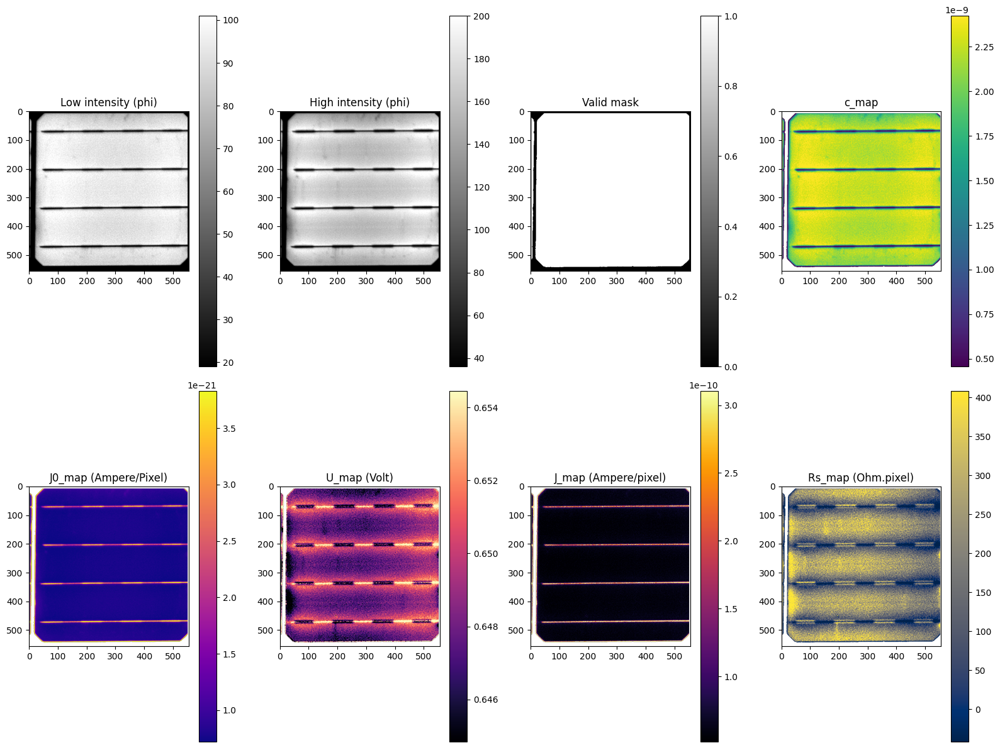

In [ ]:
# =========================================================
# CONTOH PAKAI
# =========================================================
low_cell_path  = r"C:\Users\Ghozy Abror\OneDrive - Institut Teknologi Bandung\Karirku\UNSW\Thesis\Coding\EL_Cell\3922_20_1_01232020_20_wrp\3922_20_1_01232020_20_wrp_001.tiff"
high_cell_path = r"C:\Users\Ghozy Abror\OneDrive - Institut Teknologi Bandung\Karirku\UNSW\Thesis\Coding\EL_Cell\3922_20_1_01232020_80_wrp\3922_20_1_01232020_80_wrp_001.tiff"

I_low = 0.2 * 9.608
Uth = 0.0259
VT = 38.0
N = 60   # coba mulai dari 1 kalau memang image-nya satu cell

out = run_single_cell_analysis(
    low_cell_path=low_cell_path,
    high_cell_path=high_cell_path,
    I_low=I_low,
    Uth=Uth,
    VT=VT,
    N=N,
    min_valid_intensity= 1e-6
)

## Run lebih bener

In [10]:
import numpy as np

def compute_f(intensity_map, I, Uth=0.0259, VT=0.0, N=1, pixel_area=1.0):
    """
    intensity_map di sini diasumsikan sudah berupa 1D cleaned values
    (padding removed, normalized, clipped).
    """
    phi_valid = np.asarray(intensity_map, dtype=np.float64)

    phi_valid = phi_valid[np.isfinite(phi_valid)]
    phi_valid = phi_valid[phi_valid > 0]

    if phi_valid.size == 0:
        raise ValueError("Tidak ada pixel valid untuk menghitung f.")

    integral_inv_phi = np.sum((1.0 / phi_valid) * pixel_area)

    log_term = np.log(I / integral_inv_phi)
    sum_term = N * (Uth / 2.0) * log_term
    exponent = (sum_term - VT) / (30.0 * Uth)

    return float(np.exp(exponent))

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt


def clip_for_display(img, mask, p_low=2, p_high=98):
    vals = img[mask & np.isfinite(img)]
    if vals.size == 0:
        return img
    lo, hi = np.percentile(vals, [p_low, p_high])
    return np.clip(img, lo, hi)


def summarize_map(name, arr, mask):
    vals = arr[mask & np.isfinite(arr)]
    if vals.size == 0:
        print(f"{name:12s}: tidak ada nilai valid")
        return {
            "mean": np.nan,
            "median": np.nan,
            "min": np.nan,
            "max": np.nan,
            "n": 0
        }
    elif name in ("J_map", "J0_map"):
        summary = {
            "mean": float(np.mean(vals))*vals.size,
            "median": float(np.median(vals))*vals.size,
            "min": float(np.min(vals))*vals.size,
            "max": float(np.max(vals))*vals.size,
            "n": int(vals.size)
        }
        print(
            f"{name:12s}: "
            f"mean = {summary['mean']:.3e}, "
            f"median = {summary['median']:.3e}, "
            f"min = {summary['min']:.3e}, "
            f"max = {summary['max']:.3e}, "
            f"n = {summary['n']}"
        )
    elif name == "Rs_map":
        summary = {
            "mean": float(np.mean(vals))/vals.size,
            "median": float(np.median(vals))/vals.size,
            "min": float(np.min(vals))/vals.size,
            "max": float(np.max(vals))/vals.size,
            "n": int(vals.size)
        }
        print(
            f"{name:12s}: "
            f"mean = {summary['mean']:.3e}, "
            f"median = {summary['median']:.3e}, "
            f"min = {summary['min']:.3e}, "
            f"max = {summary['max']:.3e}, "
            f"n = {summary['n']}"
        )
    else:
        summary = {
            "mean": float(np.mean(vals)),
            "median": float(np.median(vals)),
            "min": float(np.min(vals)),
            "max": float(np.max(vals)),
            "n": int(vals.size)
        }
        print(
            f"{name:12s}: "
            f"mean = {summary['mean']:.3e}, "
            f"median = {summary['median']:.3e}, "
            f"min = {summary['min']:.3e}, "
            f"max = {summary['max']:.3e}, "
            f"n = {summary['n']}"
        )

    return summary




    


import os
import numpy as np
import matplotlib.pyplot as plt

def run_single_cell_analysis(
    low_cell_path,
    high_cell_path,
    I_low,
    Uth=0.0259,
    VT=0.0,
    N=1,
    min_valid_intensity=2,
    n_id=1.0,
    V_th=0.02585,
    r_ref_p=850.0
):
    # ----------------------------
    # LOW-BIAS
    # ----------------------------
    phi_low_values = load_image_and_remove_padding(
        low_cell_path,
        min_valid_intensity=min_valid_intensity
    )
    phi_low_values = trim_outliers(
        phi_low_values,
        lower_percentile=0.1,
        upper_percentile=99.9
    )

    f = compute_f(phi_low_values, I=I_low, Uth=Uth, VT=VT, N=N)
    Vi_low = compute_Vi_from_phi_values(phi_low_values, I=I_low, f=f, Uth=Uth)

    phi_low_img = load_gray_cv2(low_cell_path)
    c_map, mask_low = compute_c_map(
        phi_low_img,
        Vi=Vi_low,
        Uth=Uth,
        min_valid_intensity=min_valid_intensity
    )
    J0_map = compute_J0_map(c_map, f=f)

    # ----------------------------
    # HIGH-BIAS
    # ----------------------------
    phi_high_img = load_gray_cv2(high_cell_path)
    mask_high = make_valid_mask(phi_high_img, min_valid_intensity=min_valid_intensity)
    mask = mask_low & mask_high

    U_map = compute_U_map(
        phi_high_img,
        c_map=c_map,
        Uth=Uth,
        mask=mask
    )

    Vi_high = estimate_Vi_from_brightest(
        phi_high_img,
        U_map=U_map,
        mask=mask,
        exclude_top_percent=0.1,
        band_width_percent=0.4
    )

    J_map = compute_J_map(
        J0_map=J0_map,
        U_map=U_map,
        Uth=Uth,
        mask=mask
    )

    Rs_map = compute_Rs_map(
        Vi=Vi_high,
        U_map=U_map,
        J_map=J_map,
        mask=mask
    )

    # ----------------------------
    # CPRA MAP (pakai LOW intensity)
    # ----------------------------
    cpra_map = compute_cpra_map(
        j0_map=J0_map,
        intensity_map=phi_low_img,
        n_id=n_id,
        V_th=V_th,
        mask=mask,
        r_ref_p=r_ref_p
    )

    # ----------------------------
    # r_i,p MAP / rparallel lokal (pakai LOW intensity)
    # ----------------------------
    r_ip_map = compute_rp_map(
        J_map=J_map,
        j0_map=J0_map,
        cpra_map=cpra_map,
        intensity_map=phi_low_img,
        n_id=n_id,
        V_th=V_th,
        mask=mask
    )

    # ----------------------------
    # SUMMARY
    # ----------------------------
    print("=" * 90)
    print("SINGLE CELL ANALYSIS")
    print("-" * 90)
    print("Low cell file  :", os.path.basename(low_cell_path))
    print("High cell file :", os.path.basename(high_cell_path))
    print(f"I_low          : {I_low}")
    print(f"Uth            : {Uth}")
    print(f"VT             : {VT}")
    print(f"N              : {N}")
    print(f"n_id           : {n_id}")
    print(f"V_th           : {V_th}")
    print(f"r_ref_p        : {r_ref_p}")
    print(f"f              : {f}")
    print(f"Vi_low         : {Vi_low}")
    print(f"Vi_high        : {Vi_high}")
    print("=" * 90)

    summaries = {}

    low_vals_valid = phi_low_img[mask & np.isfinite(phi_low_img)]
    high_vals_valid = phi_high_img[mask & np.isfinite(phi_high_img)]

    print("\nINTENSITY SUMMARY")
    print("-" * 90)

    if low_vals_valid.size > 0:
        print(
            f"{'Low intensity':12s}: "
            f"mean = {np.mean(low_vals_valid):.3e}, "
            f"median = {np.median(low_vals_valid):.3e}, "
            f"min = {np.min(low_vals_valid):.3e}, "
            f"max = {np.max(low_vals_valid):.3e}, "
            f"n = {low_vals_valid.size}"
        )
        summaries["low_intensity_mean"] = float(np.mean(low_vals_valid))
    else:
        print("Low intensity: tidak ada nilai valid")
        summaries["low_intensity_mean"] = np.nan

    if high_vals_valid.size > 0:
        print(
            f"{'High intensity':12s}: "
            f"mean = {np.mean(high_vals_valid):.3e}, "
            f"median = {np.median(high_vals_valid):.3e}, "
            f"min = {np.min(high_vals_valid):.3e}, "
            f"max = {np.max(high_vals_valid):.3e}, "
            f"n = {high_vals_valid.size}"
        )
        summaries["high_intensity_mean"] = float(np.mean(high_vals_valid))
    else:
        print("High intensity: tidak ada nilai valid")
        summaries["high_intensity_mean"] = np.nan

    print("\nMAP SUMMARY")
    print("-" * 90)
    summaries["c_map"] = summarize_map("c_map", c_map, mask)
    summaries["J0_map"] = summarize_map("J0_map", J0_map, mask)
    summaries["U_map"] = summarize_map("U_map", U_map, mask)
    summaries["J_map"] = summarize_map("J_map", J_map, mask)
    summaries["Rs_map"] = summarize_map("Rs_map", Rs_map, mask)
    summaries["cpra_map"] = summarize_map("cpra_map", cpra_map, mask)
    summaries["r_ip_map"] = summarize_map("r_ip_map", r_ip_map, mask)

    # ----------------------------
    # DISPLAY IMAGES
    # ----------------------------
    phi_low_disp = clip_for_display(phi_low_img, mask, 2, 98)
    phi_high_disp = clip_for_display(phi_high_img, mask, 2, 98)
    c_disp = clip_for_display(c_map, mask, 2, 98)
    J0_disp = clip_for_display(J0_map, mask, 2, 98)
    U_disp = clip_for_display(U_map, mask, 2, 98)
    J_disp = clip_for_display(J_map, mask, 2, 98)
    Rs_disp = clip_for_display(Rs_map, mask, 2, 98)
    cpra_disp = clip_for_display(cpra_map, mask, 2, 98)
    r_ip_disp = clip_for_display(r_ip_map, mask, 2, 98)

    mask_disp = np.where(mask, 1.0, 0.0)

    plt.figure(figsize=(20, 12))

    plt.subplot(3, 3, 1)
    plt.imshow(phi_low_disp, cmap="gray")
    plt.title("Low intensity (phi)")
    plt.colorbar()

    plt.subplot(3, 3, 2)
    plt.imshow(phi_high_disp, cmap="gray")
    plt.title("High intensity (phi)")
    plt.colorbar()

    plt.subplot(3, 3, 3)
    plt.imshow(mask_disp, cmap="gray")
    plt.title("Valid mask")
    plt.colorbar()

    plt.subplot(3, 3, 4)
    plt.imshow(c_disp, cmap="viridis")
    plt.title("c_map")
    plt.colorbar()

    plt.subplot(3, 3, 5)
    plt.imshow(J0_disp, cmap="plasma")
    plt.title("J0_map (Ampere/Pixel)")
    plt.colorbar()

    plt.subplot(3, 3, 6)
    plt.imshow(U_disp, cmap="magma")
    plt.title("U_map (Volt)")
    plt.colorbar()

    plt.subplot(3, 3, 7)
    plt.imshow(J_disp, cmap="inferno")
    plt.title("J_map (Ampere/pixel)")
    plt.colorbar()

    plt.subplot(3, 3, 8)
    plt.imshow(Rs_disp, cmap="cividis")
    plt.title("Rs_map (Ohm.pixel)")
    plt.colorbar()

    plt.subplot(3, 3, 9)
    plt.imshow(cpra_disp, cmap="turbo")
    plt.title("CPRA_map (from low intensity)")
    plt.colorbar()

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cpra_disp, cmap="turbo")
    plt.title("CPRA_map (low intensity)")
    plt.colorbar()

    plt.subplot(1, 2, 2)
    plt.imshow(r_ip_disp, cmap="coolwarm")
    plt.title("r_i,p map / rparallel local")
    plt.colorbar()

    plt.tight_layout()
    plt.show()

    return {
        "f": f,
        "Vi_low": Vi_low,
        "Vi_high": Vi_high,
        "mask": mask,
        "phi_low_img": phi_low_img,
        "phi_high_img": phi_high_img,
        "c_map": c_map,
        "J0_map": J0_map,
        "U_map": U_map,
        "J_map": J_map,
        "Rs_map": Rs_map,
        "cpra_map": cpra_map,
        "r_ip_map": r_ip_map,
        "summaries": summaries
    }



# Run Final

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3922_20_1_01232020_20_wrp_001.tiff
High cell file : 3922_20_1_01232020_80_wrp_001.tiff
I_low          : 1.9216000000000002
Uth            : 0.0259
VT             : 38.0
N              : 60
n_id           : 1.0
V_th           : 0.02585
r_ref_p        : 850.0
f              : 1.7462386331835855e-30
Vi_low         : 0.6333333333333333
Vi_high        : 0.6520514182878918

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 8.756e+01, median = 9.300e+01, min = 1.000e+00, max = 1.730e+02, n = 285982
High intensity: mean = 1.592e+02, median = 1.670e+02, min = 1.000e+00, max = 2.200e+02, n = 285982

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.101e-09, median = 2.232e-09, min = 2.400e-11, max = 4.152e-09, n = 

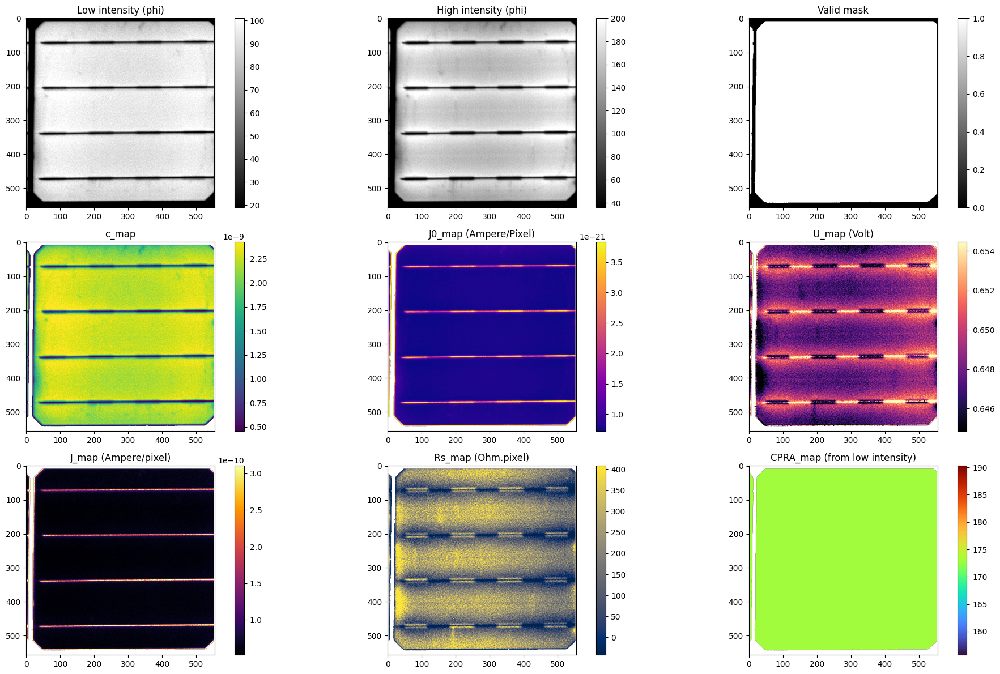

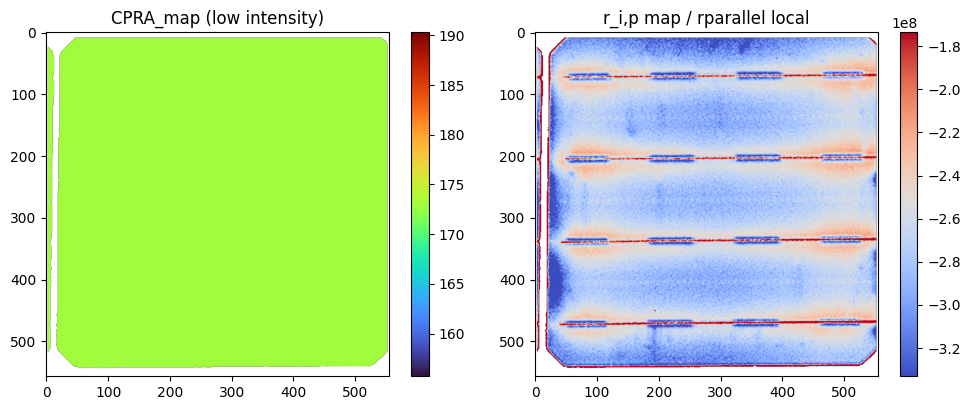

In [22]:
# =========================================================
# CONTOH PAKAI
# =========================================================
low_cell_path  = r"C:\Users\Ghozy Abror\OneDrive - Institut Teknologi Bandung\Karirku\UNSW\Thesis\Coding\EL_Cell\3922_20_1_01232020_20_wrp\3922_20_1_01232020_20_wrp_001.tiff"
high_cell_path = r"C:\Users\Ghozy Abror\OneDrive - Institut Teknologi Bandung\Karirku\UNSW\Thesis\Coding\EL_Cell\3922_20_1_01232020_80_wrp\3922_20_1_01232020_80_wrp_001.tiff"

I_low = 0.2 * 9.608
Uth = 0.0259
VT = 38.0
N = 60   # coba mulai dari 1 kalau memang image-nya satu cell

out = run_single_cell_analysis(
    low_cell_path=low_cell_path,
    high_cell_path=high_cell_path,
    I_low=I_low,
    Uth=Uth,
    VT=VT,
    N=N,
    min_valid_intensity= 1e-6
)

# ini buat ngerun massal


Panel : 3887_35_1_02222021
ELHPath match: ./EL/3887_35_1_02222021_80.tiff
VT    : 38.4
I_low : 1.8
cells : 60
SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_000.tiff
High cell file : 3887_35_1_02222021_80_wrp_000.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 7.12140609760889e-28
Vi_low         : 0.64
Vi_high        : 0.638490835279589

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 9.131e+01, median = 9.800e+01, min = 5.000e+00, max = 1.830e+02, n = 281961
High intensity: mean = 7.647e+01, median = 8.000e+01, min = 5.000e+00, max = 1.060e+02, n = 281961

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 1.694e-09, median = 1.818e-09, min = 9.276e-11, max = 3.395

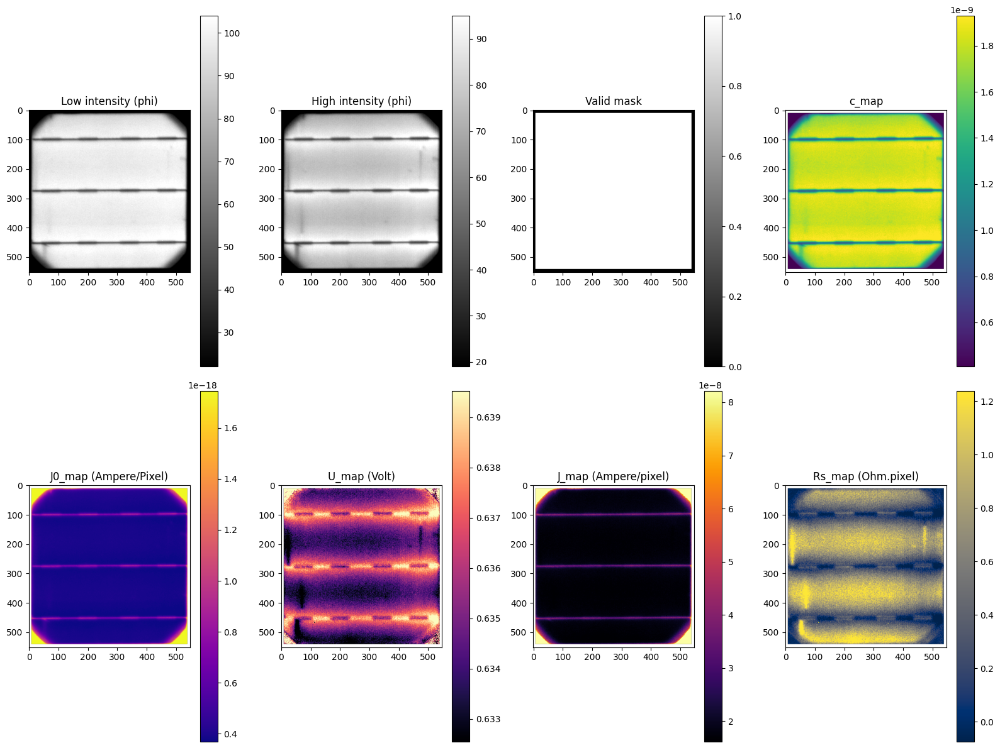

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_001.tiff
High cell file : 3887_35_1_02222021_80_wrp_001.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 7.559347431399694e-28
Vi_low         : 0.64
Vi_high        : 0.6380151994460582

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.083e+02, median = 1.170e+02, min = 6.000e+00, max = 1.560e+02, n = 286740
High intensity: mean = 8.704e+01, median = 9.100e+01, min = 5.000e+00, max = 1.190e+02, n = 286740

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.010e-09, median = 2.171e-09, min = 1.113e-10, max = 2.894e-09, n = 286740
J0_map      : mean = 1.371e-13, median = 9.986e-14, min = 7.489e-14, max = 1.947e-12, n = 28

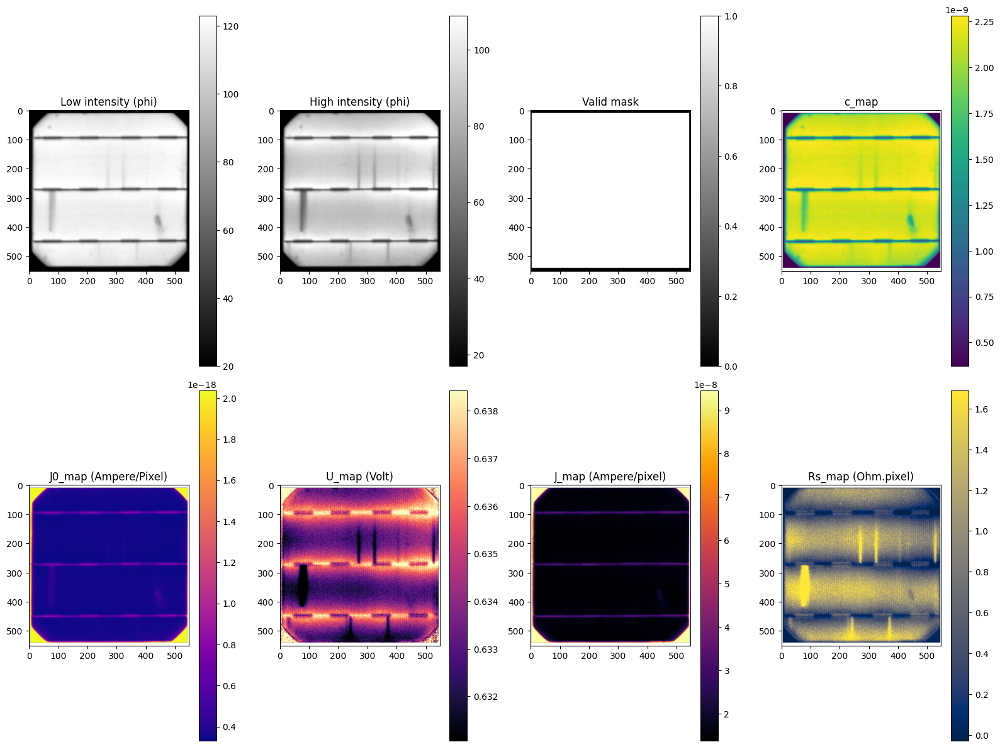

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_002.tiff
High cell file : 3887_35_1_02222021_80_wrp_002.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 7.474988171846394e-28
Vi_low         : 0.6399999999999999
Vi_high        : 0.6374759067936965

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.222e+02, median = 1.320e+02, min = 6.000e+00, max = 1.580e+02, n = 289926
High intensity: mean = 9.457e+01, median = 9.900e+01, min = 5.000e+00, max = 1.390e+02, n = 289926

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.268e-09, median = 2.449e-09, min = 1.113e-10, max = 2.931e-09, n = 289926
J0_map      : mean = 1.295e-13, median = 8.850e-14, min = 7.393e-14, max = 1.9

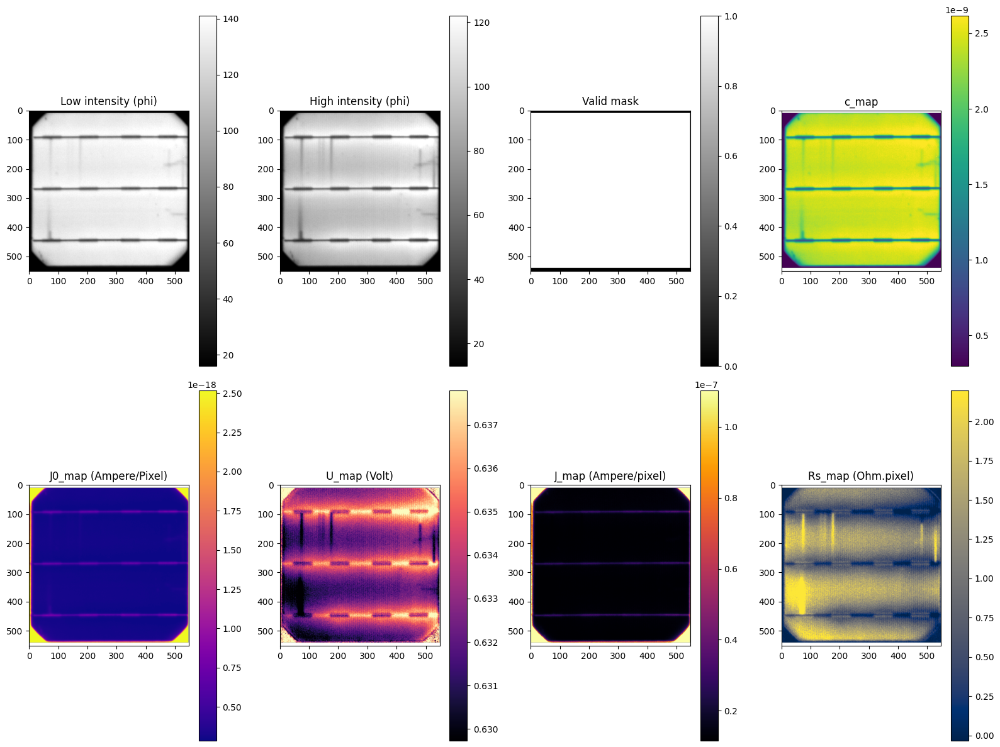

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_003.tiff
High cell file : 3887_35_1_02222021_80_wrp_003.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 7.661175543313911e-28
Vi_low         : 0.6399999999999999
Vi_high        : 0.6371085247474048

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.231e+02, median = 1.330e+02, min = 6.000e+00, max = 1.600e+02, n = 289926
High intensity: mean = 9.568e+01, median = 1.010e+02, min = 6.000e+00, max = 1.350e+02, n = 289926

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.283e-09, median = 2.467e-09, min = 1.113e-10, max = 2.968e-09, n = 289926
J0_map      : mean = 1.313e-13, median = 9.002e-14, min = 7.483e-14, max = 1.9

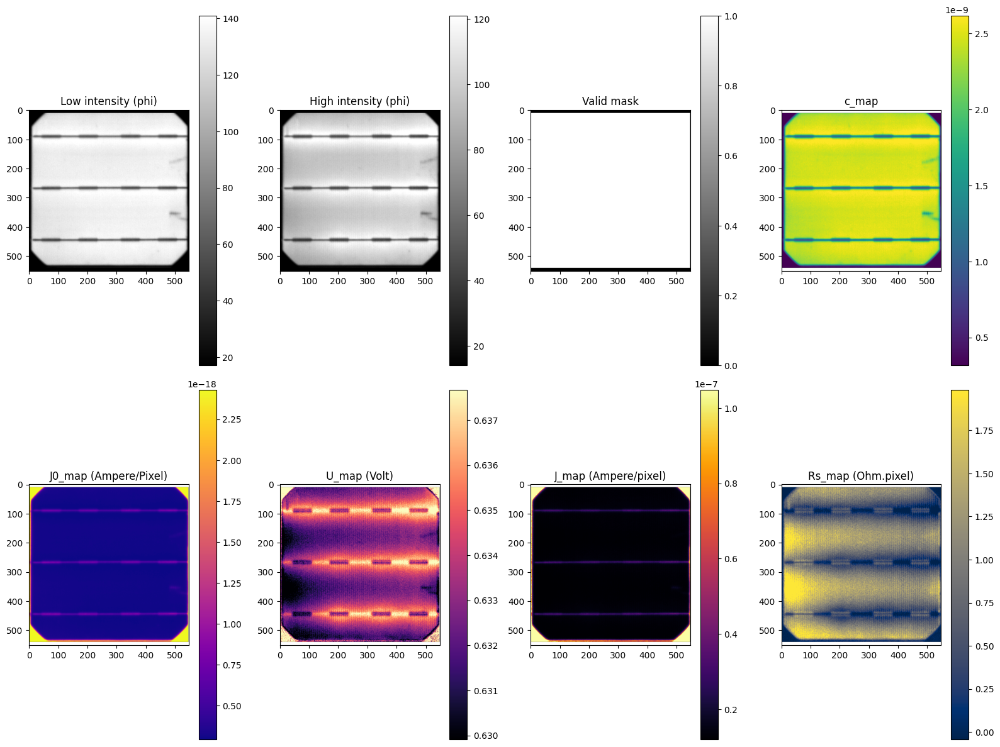

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_004.tiff
High cell file : 3887_35_1_02222021_80_wrp_004.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 5.830210691082469e-28
Vi_low         : 0.6399999999999999
Vi_high        : 0.6378582845596115

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.086e+02, median = 1.170e+02, min = 6.000e+00, max = 1.820e+02, n = 290988
High intensity: mean = 8.669e+01, median = 9.100e+01, min = 6.000e+00, max = 1.240e+02, n = 290988

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.015e-09, median = 2.171e-09, min = 1.113e-10, max = 3.377e-09, n = 290988
J0_map      : mean = 1.126e-13, median = 7.816e-14, min = 5.024e-14, max = 1.5

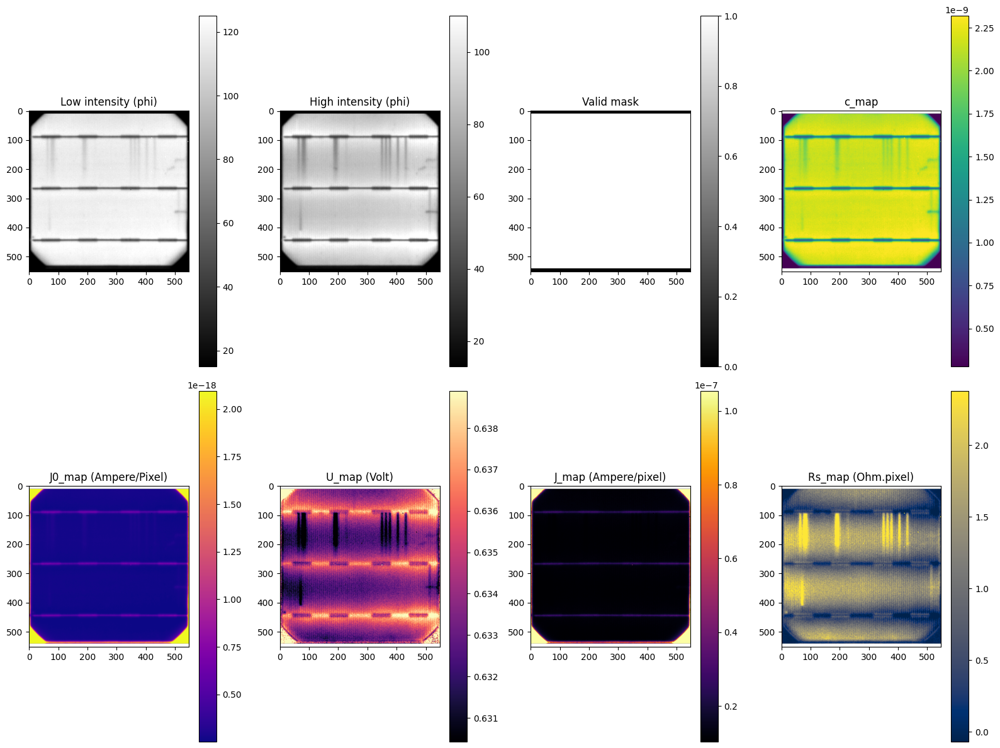

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_005.tiff
High cell file : 3887_35_1_02222021_80_wrp_005.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 7.375272373095936e-28
Vi_low         : 0.64
Vi_high        : 0.6371509768139489

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.229e+02, median = 1.340e+02, min = 6.000e+00, max = 1.590e+02, n = 290988
High intensity: mean = 9.477e+01, median = 1.010e+02, min = 6.000e+00, max = 1.350e+02, n = 290988

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.280e-09, median = 2.486e-09, min = 1.113e-10, max = 2.950e-09, n = 290988
J0_map      : mean = 1.300e-13, median = 8.633e-14, min = 7.275e-14, max = 1.928e-12, n = 29

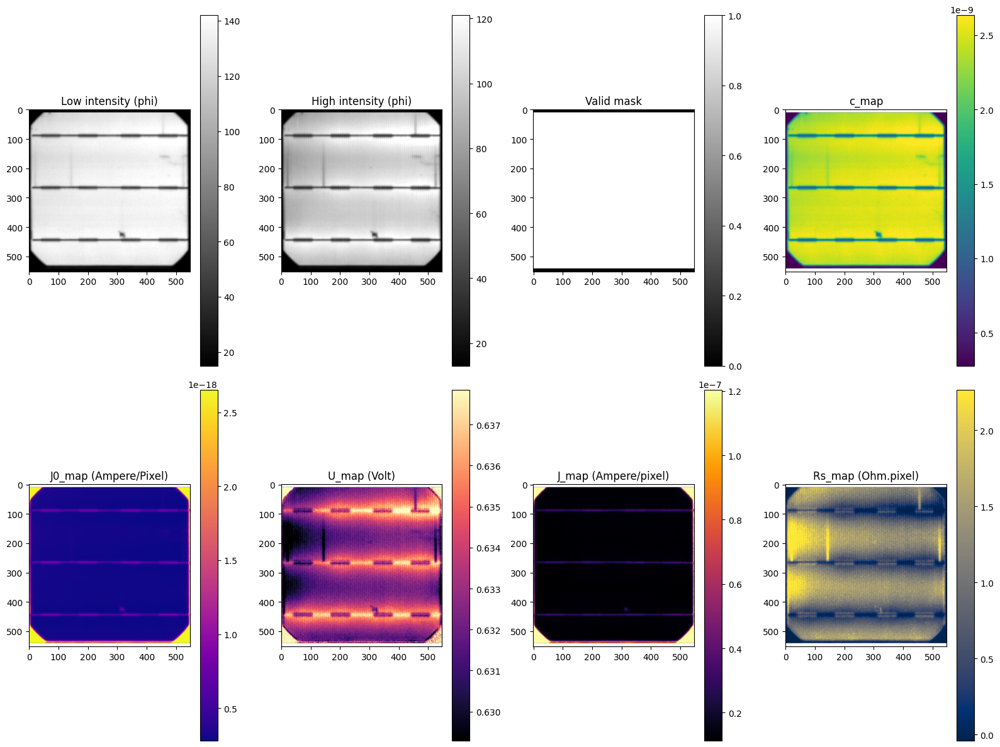

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_006.tiff
High cell file : 3887_35_1_02222021_80_wrp_006.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 5.931618544533023e-28
Vi_low         : 0.64
Vi_high        : 0.6381492128328624

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.214e+02, median = 1.300e+02, min = 6.000e+00, max = 1.980e+02, n = 289395
High intensity: mean = 9.533e+01, median = 1.000e+02, min = 6.000e+00, max = 1.440e+02, n = 289395

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.252e-09, median = 2.412e-09, min = 1.113e-10, max = 3.673e-09, n = 289395
J0_map      : mean = 1.029e-13, median = 7.117e-14, min = 4.673e-14, max = 1.542e-12, n = 28

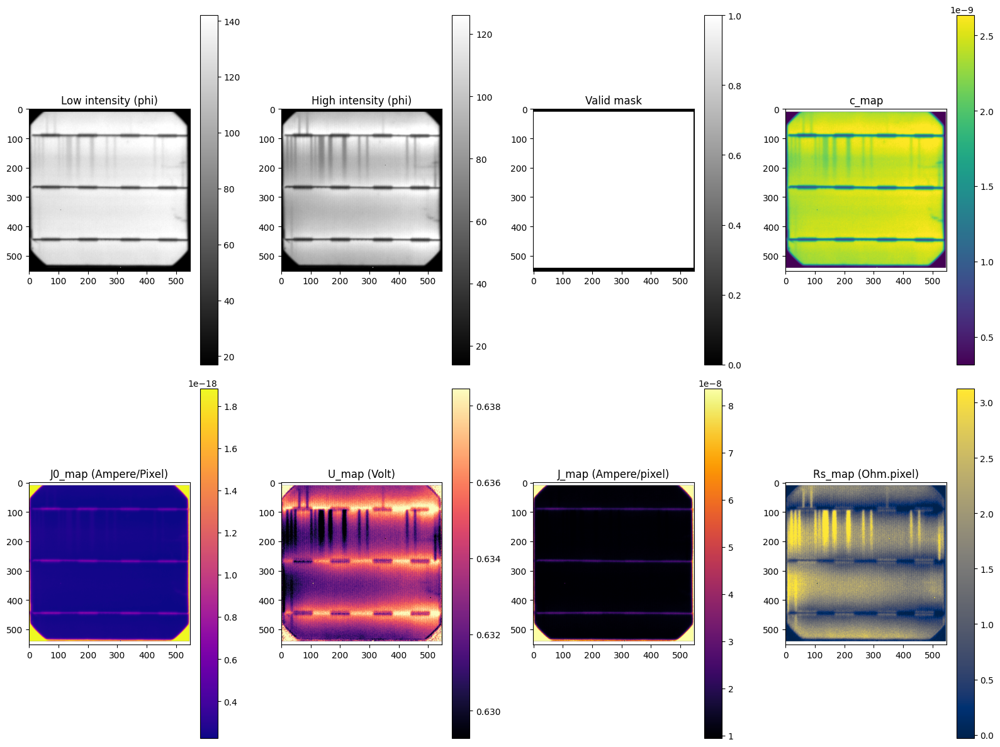

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_007.tiff
High cell file : 3887_35_1_02222021_80_wrp_007.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 5.5591292945004625e-28
Vi_low         : 0.64
Vi_high        : 0.6384137901062654

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 8.808e+01, median = 9.600e+01, min = 5.000e+00, max = 1.810e+02, n = 289926
High intensity: mean = 7.285e+01, median = 7.700e+01, min = 5.000e+00, max = 1.680e+02, n = 289926

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 1.634e-09, median = 1.781e-09, min = 9.276e-11, max = 3.358e-09, n = 289926
J0_map      : mean = 1.275e-13, median = 9.049e-14, min = 4.800e-14, max = 1.738e-12, n = 2

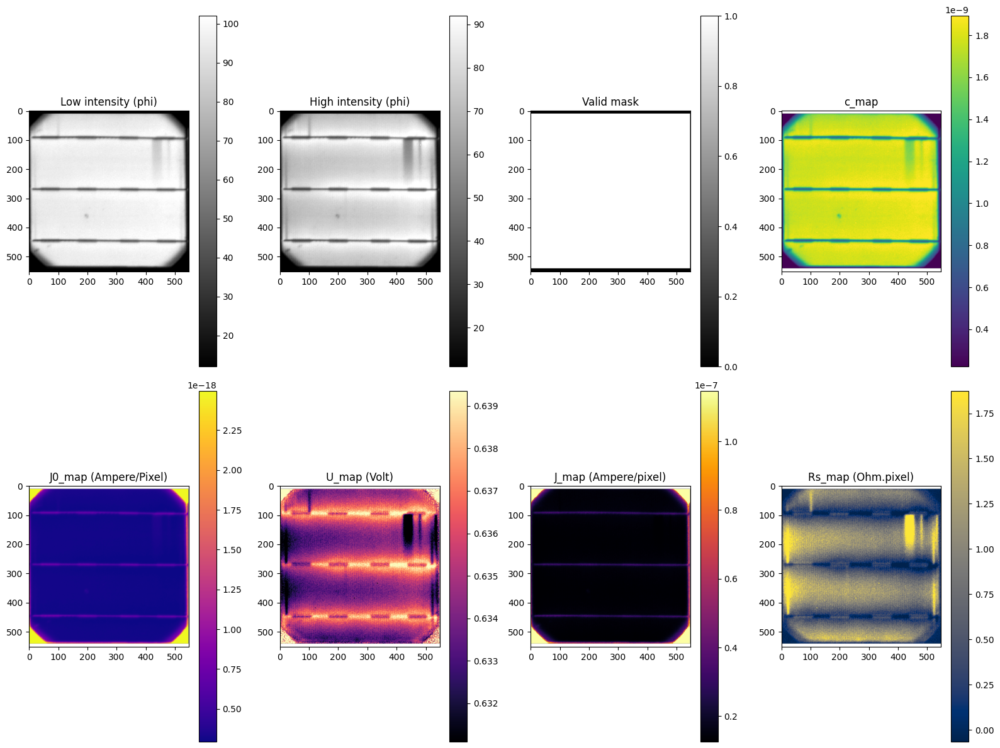

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_008.tiff
High cell file : 3887_35_1_02222021_80_wrp_008.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 8.031587427275241e-28
Vi_low         : 0.6399999999999998
Vi_high        : 0.6365670416105844

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.241e+02, median = 1.340e+02, min = 6.000e+00, max = 1.630e+02, n = 286209
High intensity: mean = 9.684e+01, median = 1.020e+02, min = 6.000e+00, max = 1.300e+02, n = 286209

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.302e-09, median = 2.486e-09, min = 1.113e-10, max = 3.024e-09, n = 286209
J0_map      : mean = 1.302e-13, median = 9.247e-14, min = 7.601e-14, max = 2.0

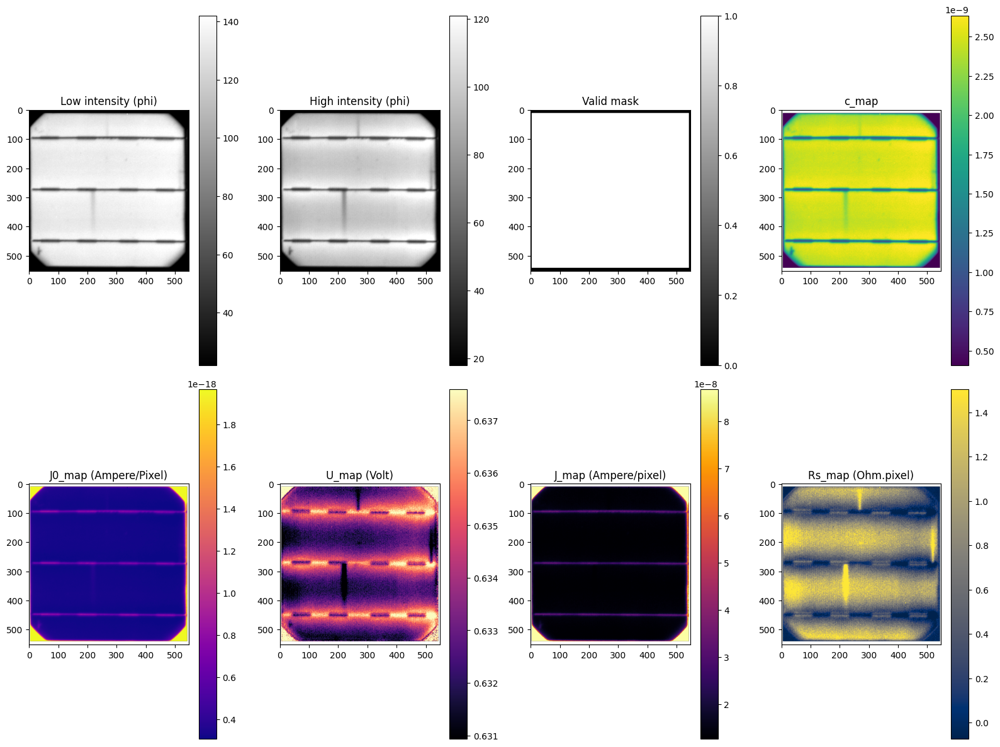

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_009.tiff
High cell file : 3887_35_1_02222021_80_wrp_009.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 7.544112322249446e-28
Vi_low         : 0.64
Vi_high        : 0.6370868202292488

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.249e+02, median = 1.330e+02, min = 6.000e+00, max = 2.000e+02, n = 279837
High intensity: mean = 9.758e+01, median = 1.010e+02, min = 4.000e+00, max = 1.330e+02, n = 279837

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.318e-09, median = 2.467e-09, min = 1.113e-10, max = 3.710e-09, n = 279837
J0_map      : mean = 1.129e-13, median = 8.556e-14, min = 5.690e-14, max = 1.897e-12, n = 27

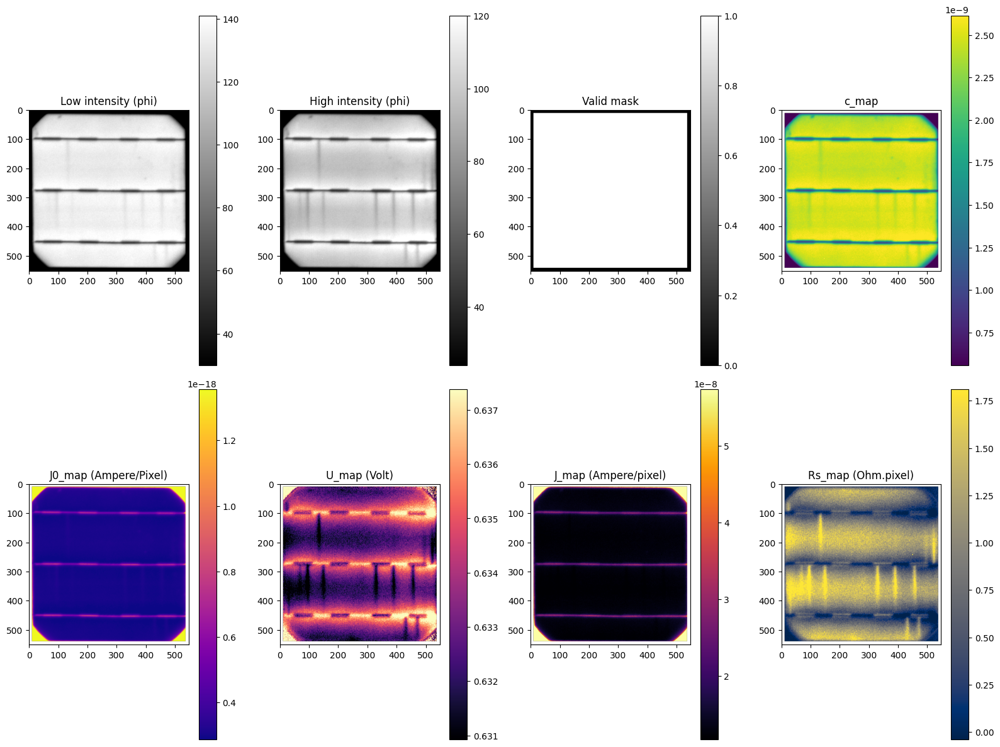

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_010.tiff
High cell file : 3887_35_1_02222021_80_wrp_010.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 6.512590590205466e-28
Vi_low         : 0.6399999999999999
Vi_high        : 0.6370647870505485

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.211e+02, median = 1.330e+02, min = 6.000e+00, max = 1.860e+02, n = 290988
High intensity: mean = 9.439e+01, median = 1.010e+02, min = 5.000e+00, max = 1.310e+02, n = 290988

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.247e-09, median = 2.467e-09, min = 1.113e-10, max = 3.451e-09, n = 290988
J0_map      : mean = 1.156e-13, median = 7.680e-14, min = 5.492e-14, max = 1.7

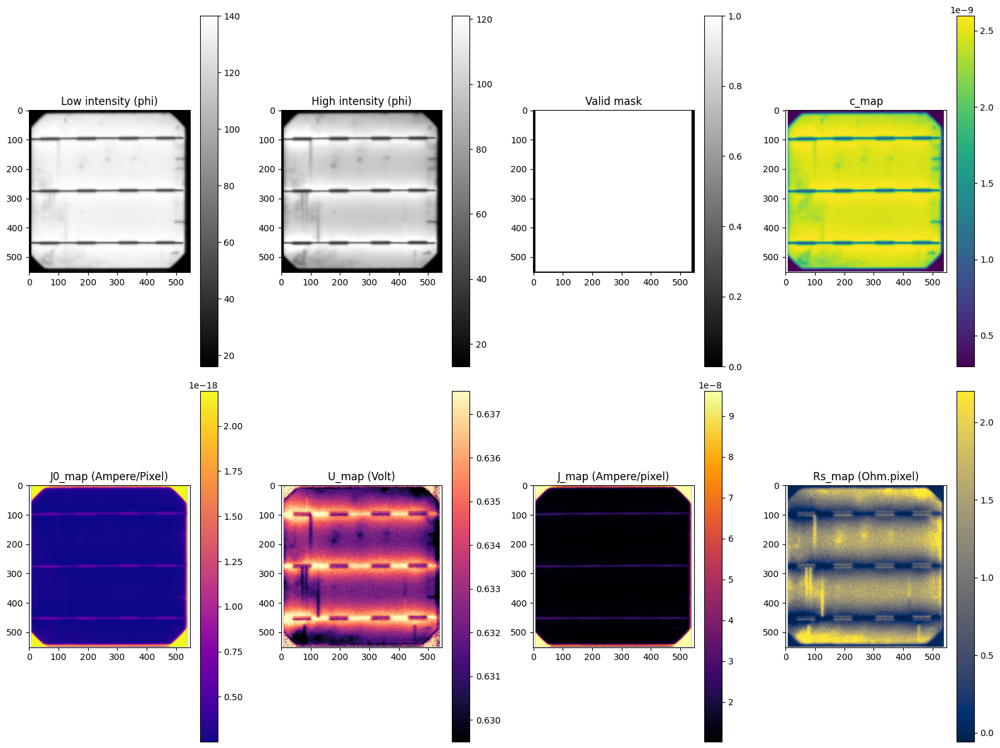

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_011.tiff
High cell file : 3887_35_1_02222021_80_wrp_011.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 5.719899057639665e-28
Vi_low         : 0.6399999999999998
Vi_high        : 0.6370367719044963

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.233e+02, median = 1.350e+02, min = 6.000e+00, max = 2.000e+02, n = 295920
High intensity: mean = 9.512e+01, median = 1.010e+02, min = 5.000e+00, max = 1.390e+02, n = 295920

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.287e-09, median = 2.505e-09, min = 1.113e-10, max = 3.710e-09, n = 295920
J0_map      : mean = 1.039e-13, median = 6.758e-14, min = 4.562e-14, max = 1.5

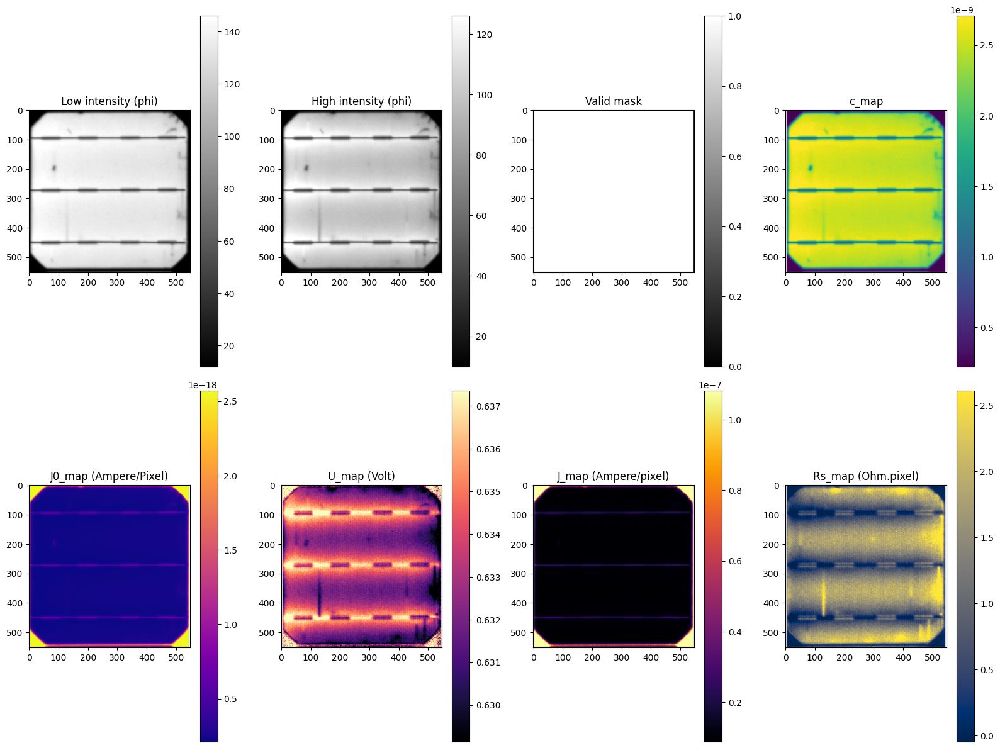

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_012.tiff
High cell file : 3887_35_1_02222021_80_wrp_012.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 5.587955010567592e-28
Vi_low         : 0.6399999999999999
Vi_high        : 0.6369732135903917

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.153e+02, median = 1.270e+02, min = 6.000e+00, max = 1.900e+02, n = 299208
High intensity: mean = 8.950e+01, median = 9.600e+01, min = 5.000e+00, max = 1.260e+02, n = 299208

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.139e-09, median = 2.356e-09, min = 1.113e-10, max = 3.525e-09, n = 299208
J0_map      : mean = 1.100e-13, median = 7.096e-14, min = 4.743e-14, max = 1.5

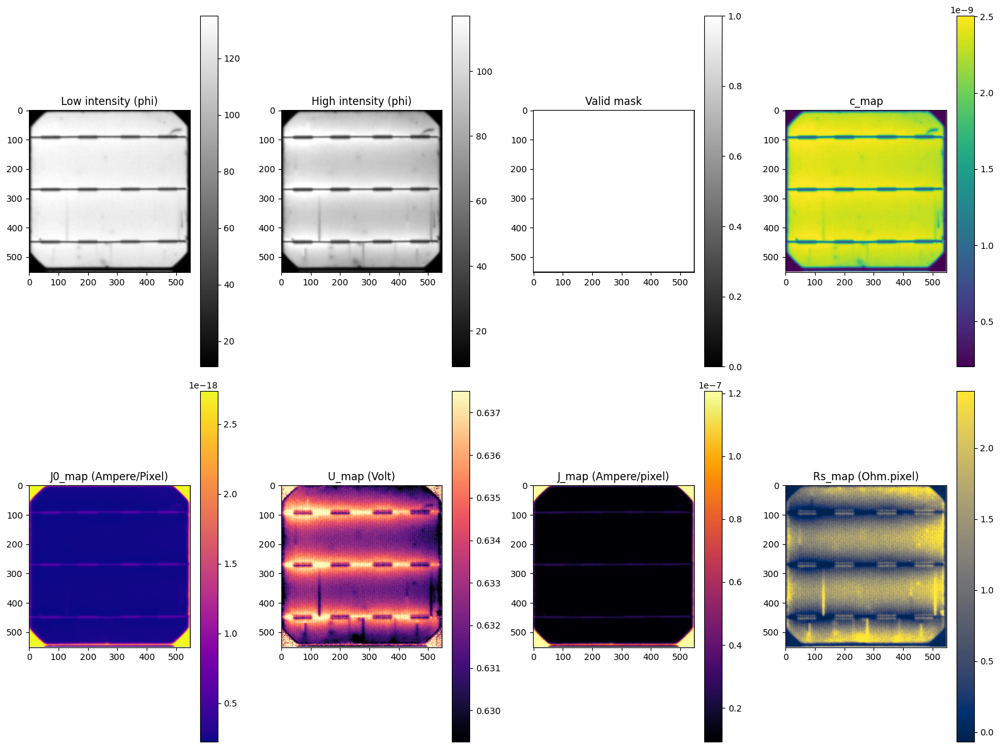

SINGLE CELL ANALYSIS
------------------------------------------------------------------------------------------
Low cell file  : 3887_35_1_02222021_20_wrp_013.tiff
High cell file : 3887_35_1_02222021_80_wrp_013.tiff
I_low          : 1.8
Uth            : 0.0259
VT             : 38.4
N              : 60
f              : 7.199228703667307e-28
Vi_low         : 0.6399999999999999
Vi_high        : 0.6373702067422169

INTENSITY SUMMARY
------------------------------------------------------------------------------------------
Low intensity: mean = 1.228e+02, median = 1.340e+02, min = 6.000e+00, max = 1.800e+02, n = 299208
High intensity: mean = 9.412e+01, median = 1.010e+02, min = 6.000e+00, max = 1.390e+02, n = 299208

MAP SUMMARY
------------------------------------------------------------------------------------------
c_map       : mean = 2.279e-09, median = 2.486e-09, min = 1.113e-10, max = 3.339e-09, n = 299208
J0_map      : mean = 1.320e-13, median = 8.665e-14, min = 6.450e-14, max = 1.9

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================
# SETTING
# =========================
EL_CELL_DIR = "EL_cell"
ANONDB_CSV = "AnonDB.csv"

OUTPUT_CELL = "result_per_cell.csv"
OUTPUT_PANEL = "result_per_panel.csv"

EXPECTED_N = 60
Uth = 0.0259

# =========================
# LIST FOLDER MANUAL
# =========================
PAIRS = [
    ("3887_35_1_02222021_20_wrp", "3887_35_1_02222021_80_wrp"),
    ("3922_20_1_01232020_20_wrp", "3922_20_1_01232020_80_wrp"),
    ("10084_35_1_01272020_20", "10084_35_1_01272020_80"),
    ("10084_35_1_02222021_20", "10084_35_1_02222021_80"),
    ("10085_35_1_01272020_20", "10085_35_1_01272020_80"),
    ("10085_35_1_02222021_20", "10085_35_1_02222021_80"),
    ("10319_34_5_01202020_20", "10319_34_5_01202020_80"),
]

# =========================
# HELPER
# =========================
def extract_idx(filename):
    # ambil 3 digit terakhir, misal _000, _015, _059
    m = re.search(r"(\d{3})(?=\.[^.]+$)", filename)
    if m:
        return int(m.group(1))

    # fallback kalau formatnya ada _cell_000
    m = re.search(r"_cell_(\d{3})", filename)
    if m:
        return int(m.group(1))

    return None


def build_map(folder):
    files = os.listdir(folder)
    out = {}
    for f in files:
        full = os.path.join(folder, f)
        if not os.path.isfile(full):
            continue
        idx = extract_idx(f)
        if idx is not None:
            out[idx] = full
    return out


def folder80_to_ELHPath(folder_name):
    """
    Contoh:
    3903_35_1_01272020_80_wrp -> ./EL/3903_35_1_01272020_80.tiff
    10084_35_1_01272020_80    -> ./EL/10084_35_1_01272020_80.tiff
    """
    base = folder_name
    if base.endswith("_wrp"):
        base = base[:-4]
    return f"./EL/{base}.tiff"


def panel_key_from_low_folder(low_folder):
    if low_folder.endswith("_20_wrp"):
        return low_folder[:-7]
    if low_folder.endswith("_20"):
        return low_folder[:-3]
    return low_folder


def build_metadata_lookup_from_ELHPath(csv_path):
    df = pd.read_csv(csv_path)

    lookup = {}
    for _, r in df.iterrows():
        elh = r.get("ELHPath", None)

        if pd.isna(elh):
            continue

        elh = str(elh).strip().replace("\\", "/")
        lookup[elh] = {
            "VT": r["Nameplate_Voc_(V)"],
            "I_low": r["Low_Applied_Current_(A)"]
        }

    return lookup


# =========================
# MAIN
# =========================
def run():
    meta_lookup = build_metadata_lookup_from_ELHPath(ANONDB_CSV)

    cell_rows = []
    panel_rows = []

    for low_f, high_f in PAIRS:
        panel_key = panel_key_from_low_folder(low_f)
        elh_key = folder80_to_ELHPath(high_f)

        if elh_key not in meta_lookup:
            print(f"[SKIP] metadata tidak ketemu untuk {panel_key}")
            print(f"       cari ELHPath: {elh_key}")
            continue

        VT = meta_lookup[elh_key]["VT"]
        I_low = meta_lookup[elh_key]["I_low"]

        low_dir = os.path.join(EL_CELL_DIR, low_f)
        high_dir = os.path.join(EL_CELL_DIR, high_f)

        low_map = build_map(low_dir)
        high_map = build_map(high_dir)

        idxs = sorted(set(low_map.keys()) & set(high_map.keys()))
        idxs = [i for i in idxs if 0 <= i < EXPECTED_N]

        print("\n===================================")
        print("Panel :", panel_key)
        print("ELHPath match:", elh_key)
        print("VT    :", VT)
        print("I_low :", I_low)
        print("cells :", len(idxs))
        print("===================================")

        Rs_list = []
        I0_list = []

        for i in idxs:
            try:
                out = run_single_cell_analysis(
                    low_cell_path=low_map[i],
                    high_cell_path=high_map[i],
                    I_low=float(I_low),
                    Uth=Uth,
                    VT=float(VT),
                    N=EXPECTED_N,
                    min_valid_intensity=2
                )

                plt.close("all")

                Rs = out["summaries"]["Rs_map"]["mean"]
                I0 = out["summaries"]["J0_map"]["mean"]

                cell_rows.append({
                    "panel": panel_key,
                    "ELHPath": elh_key,
                    "cell": i,
                    "Rs": Rs,
                    "I0": I0,
                    "VT": VT,
                    "I_low": I_low
                })

                if np.isfinite(Rs):
                    Rs_list.append(Rs)
                if np.isfinite(I0):
                    I0_list.append(I0)

            except Exception as e:
                print(f"[FAIL CELL {i}] {e}")

        panel_rows.append({
            "panel": panel_key,
            "ELHPath": elh_key,
            "n_cells": len(idxs),
            "VT": VT,
            "I_low": I_low,
            "Rs_mean": np.mean(Rs_list) if Rs_list else np.nan,
            "Rs_median": np.median(Rs_list) if Rs_list else np.nan,
            "I0_mean": np.mean(I0_list) if I0_list else np.nan,
            "I0_median": np.median(I0_list) if I0_list else np.nan,
        })

    df_cell = pd.DataFrame(cell_rows)
    df_panel = pd.DataFrame(panel_rows)

    df_cell.to_csv(OUTPUT_CELL, index=False, encoding="utf-8-sig")
    df_panel.to_csv(OUTPUT_PANEL, index=False, encoding="utf-8-sig")

    print("\nDONE")
    print("Saved:", OUTPUT_CELL)
    print("Saved:", OUTPUT_PANEL)
    return df_cell, df_panel


# =========================
# RUN
# =========================
df_cell, df_panel = run()
display(df_panel)
display(df_cell.head())